# Dense U-Net Arquitectura Básica

Vamos a constuir una arquitecutra U-Net básica (con y sin dropout) para realizar segmentación semántica del dataset Data Science Bowl (2018) que contiene imágenes de tejido biológico dónde se han obtenido mascaras de los nucleos celulares. Usaremos U-net para realizar la segmentación semántica, contruiremos un modelo básico, y luego una modificación con Dropout. El tamaño de las imágenes de entrada será 128x128.

[Enlace Dataset](https://www.kaggle.com/c/data-science-bowl-2018/data)

[Paper Original](https://arxiv.org/pdf/1505.04597.pdf)

## 1. Importamos librerías

In [ ]:
# %matplotlib inline
# import warnings
# warnings.filterwarnings("ignore")
# warnings.simplefilter("ignore")
!pip install pydicom
import os
import pandas as pd
import numpy as np
import seaborn as sns
import pydicom
from PIL import Image
import matplotlib.pyplot as plt
import tensorflow.keras.backend as K
import keras.backend as K
import tensorflow as tf
import keras.backend as K
import tensorflow.keras.backend as K
from tensorflow.keras.applications import VGG16, ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import MaxPooling2D, UpSampling2D, Concatenate, BatchNormalization, Dropout, Normalization
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, concatenate
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from sklearn.model_selection import train_test_split
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras.losses import binary_crossentropy
from keras.callbacks import ReduceLROnPlateau
from keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.regularizers import l2
from tensorflow.keras import layers, models

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 72.4 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 2. Definimos configuración básica

In [ ]:
# Adjust parameters
input_size = (512, 512, 1)
batch_size = 8  # 8, 16, 32
seed = 42
epochs = 125

# directory of data
image_folder = "/content/drive/MyDrive/IMAGENES_SIN_SEGMENTAR"
mask_folder = "/content/drive/MyDrive/IMAGENES_SEGMENTADAS_ARREGLADAS"

# Get path
image_paths = [os.path.join(image_folder, img) for img in sorted(os.listdir(image_folder)) if img.endswith(".dcm")]
mask_paths = [os.path.join(mask_folder, mask) for mask in sorted(os.listdir(mask_folder)) if mask.endswith(".png")]

## 3. Adecuamos el dataset

In [ ]:
# Load DICOM image
def load_image(image_path, target_size=(512, 512)):
    # Read DICOM file
    dicom = pydicom.dcmread(image_path)
    # Get pixel array
    image = dicom.pixel_array

    # Normalize to 0-1 range
    image = image - np.min(image)
    image = image / (np.max(image) + 1e-8)

    # Convert to uint8 for PIL
    image_uint8 = (image * 255).astype(np.uint8)

    # Convert to PIL Image and resize
    pil_image = Image.fromarray(image_uint8)
    if pil_image.size != target_size:
        pil_image = pil_image.resize(target_size)

    # Convert back to numpy array and normalize
    image = np.array(pil_image) / 255.0

    # Add channel dimension
    image = np.expand_dims(image, axis=-1)
    return image

# Load mask
def load_mask(mask_path, target_size=(512, 512)):
    mask = load_img(mask_path, target_size=target_size, color_mode="grayscale")
    mask = img_to_array(mask)

    mask_discrete = np.zeros_like(mask)
    mask_discrete[mask > 200] = 3  # Para valor 215
    mask_discrete[(mask > 90) & (mask <= 120)] = 2  # Para valor 109
    mask_discrete[(mask > 65) & (mask <= 85)] = 1  # Para valor 73
    # El valor 30 (fondo) se mantiene como 0

    return mask_discrete

# First, split the paths
X_train_paths, X_val_paths, y_train_paths, y_val_paths = train_test_split(
    image_paths, mask_paths, test_size=0.2, random_state=seed
)
X_val_paths, X_test_paths, y_val_paths, y_test_paths = train_test_split(
    X_val_paths, y_val_paths, test_size=0.5, random_state=seed
)

print(f"Training set:   X: {len(X_train_paths)}, y: {len(y_train_paths)}")
print(f"Validation set: X: {len(X_val_paths)}, y: {len(y_val_paths)}")
print(f"Test set:      X: {len(X_test_paths)}, y: {len(y_test_paths)}")

Training set:   X: 413, y: 413
Validation set: X: 52, y: 52
Test set:      X: 52, y: 52


In [ ]:
# Actualizaciones de configuración
data_gen_args = dict(
    rotation_range=15,  # Reducido de 20
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1,  # Reducido de 0.15
    shear_range=0.02,  # Reducido de 0.05
    fill_mode='nearest'  # Cambiado de reflect
)

image_datagen = ImageDataGenerator(**data_gen_args)
mask_datagen = ImageDataGenerator(**data_gen_args)

In [ ]:
# Generador de datos modificado para preservar valores discretos
def train_generator(image_paths, mask_paths, batch_size):
    while True:
        indices = np.random.permutation(len(image_paths))
        image_paths_shuffled = [image_paths[i] for i in indices]
        mask_paths_shuffled = [mask_paths[i] for i in indices]

        for start in range(0, len(image_paths), batch_size):
            end = min(start + batch_size, len(image_paths))
            X_batch = []
            Y_batch = []

            for img_path, msk_path in zip(image_paths_shuffled[start:end],
                                        mask_paths_shuffled[start:end]):
                try:
                    # Cargar imagen y máscara
                    image = load_image(img_path)  # Ya devuelve (H,W,1)
                    mask = load_mask(msk_path)
                    mask = np.expand_dims(mask, axis=-1)

                    # Aplicar aumentación simple sin usar ImageDataGenerator
                    # Aquí puedes agregar transformaciones simples si las necesitas

                    X_batch.append(image)
                    Y_batch.append(mask)

                except Exception as e:
                    print(f"Error loading {img_path}: {str(e)}")
                    continue

            if X_batch:
                X_batch = np.array(X_batch)
                Y_batch = np.array(Y_batch)
                yield X_batch, Y_batch
# Initialize generator
train_gen = train_generator(X_train_paths, y_train_paths, batch_size)
steps_per_epoch = len(X_train_paths) // batch_size

# Load validation and test data into memory
X_val = np.array([load_image(img_path) for img_path in X_val_paths])
y_val = np.array([load_mask(msk_path) for msk_path in y_val_paths])

X_test = np.array([load_image(img_path) for img_path in X_test_paths])
y_test = np.array([load_mask(msk_path) for msk_path in y_test_paths])

## 4. Mostramos algún elemento del dataset

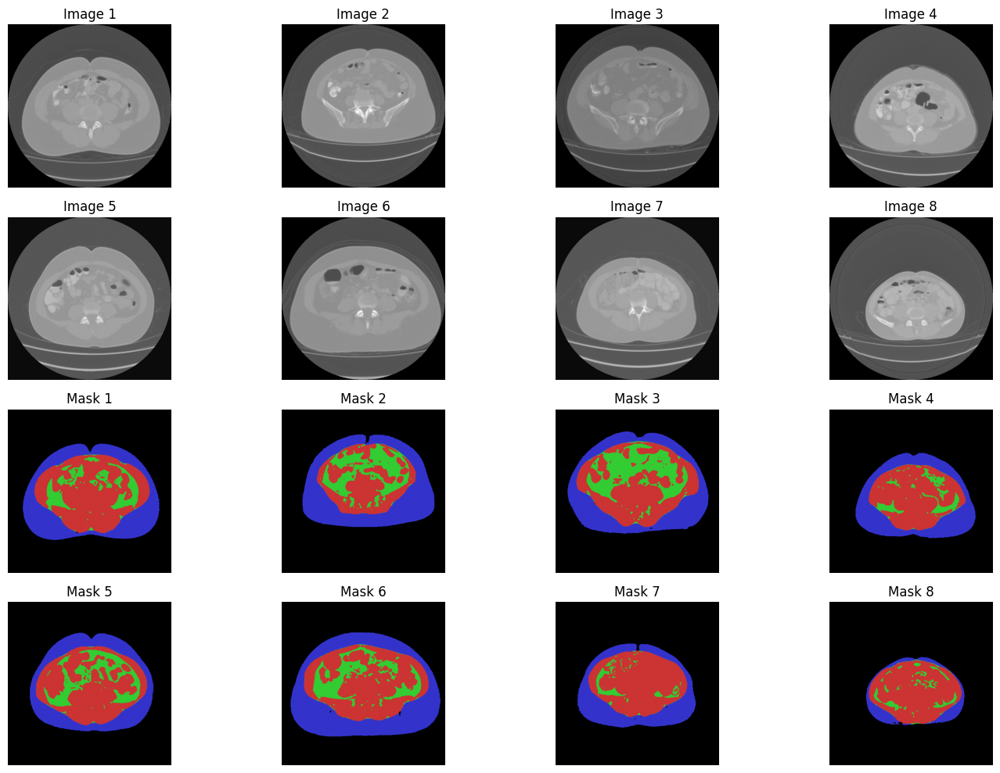

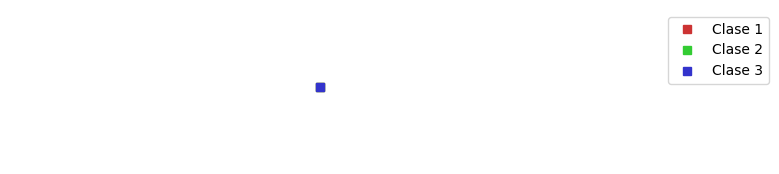

Máscara 1 valores únicos después del procesamiento: [0. 1. 2. 3.]
Máscara 2 valores únicos después del procesamiento: [0. 1. 2. 3.]
Máscara 3 valores únicos después del procesamiento: [0. 1. 2. 3.]
Máscara 4 valores únicos después del procesamiento: [0. 1. 2. 3.]
Máscara 5 valores únicos después del procesamiento: [0. 1. 2. 3.]
Máscara 6 valores únicos después del procesamiento: [0. 1. 2. 3.]
Máscara 7 valores únicos después del procesamiento: [0. 1. 2. 3.]
Máscara 8 valores únicos después del procesamiento: [0. 1. 2. 3.]


In [ ]:
def visualize_batch():
    images, masks = next(train_gen)

    # Definir colores más distintivos
    colors = {
        1: [0.8, 0.2, 0.2],  # Rojo más intenso
        2: [0.2, 0.8, 0.2],  # Verde más intenso
        3: [0.2, 0.2, 0.8]   # Azul más intenso
    }

    plt.figure(figsize=(15, 10))
    for i in range(8):
        plt.subplot(4, 4, i+1)
        plt.title(f"Image {i+1}")
        plt.imshow(images[i].squeeze(), cmap='gray')
        plt.axis('off')

        plt.subplot(4, 4, i+9)
        plt.title(f"Mask {i+1}")

        mask = masks[i].squeeze()
        mask_colored = np.zeros((*mask.shape, 3))

        for class_idx, color in colors.items():
            mask_colored[mask == class_idx] = color

        plt.imshow(mask_colored)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

    # Leyenda con nombres específicos
    plt.figure(figsize=(8, 2))
    for class_idx, color in colors.items():
        plt.plot(0, 0, 's', color=color, label=f'Clase {class_idx}')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.axis('off')
    plt.show()
# Para ejecutar la visualización
visualize_batch()

# Para debug: imprimir los valores únicos en las máscaras procesadas
def print_unique_values():
    images, masks = next(train_gen)
    for i in range(len(masks)):
        print(f"Máscara {i+1} valores únicos después del procesamiento:", np.unique(masks[i]))

print_unique_values()

Valores únicos en la máscara: [ 30.  73. 109. 215.]


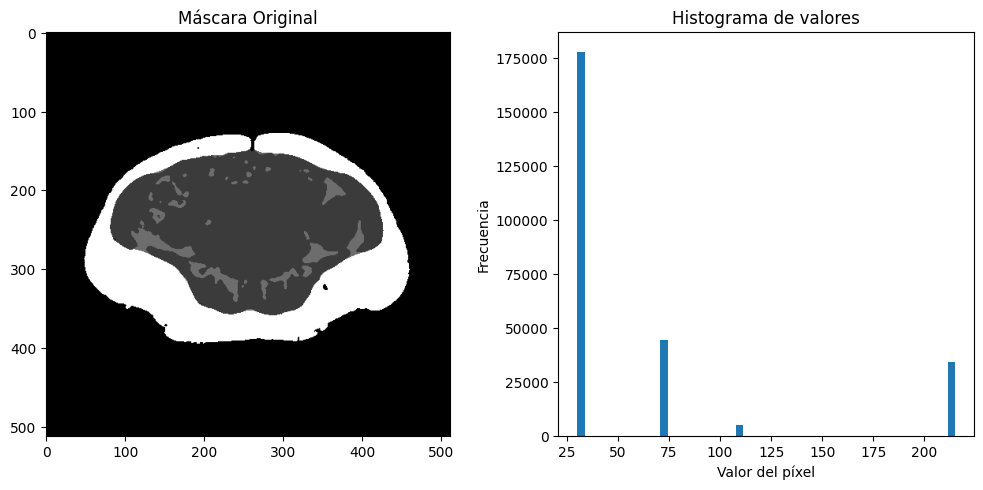

In [ ]:
# Función para analizar una imagen individual
def analyze_mask_image(mask_path):
    # Cargar la imagen sin procesamiento
    mask = load_img(mask_path, color_mode="grayscale")
    mask_array = img_to_array(mask)

    # Mostrar la imagen
    plt.figure(figsize=(10, 5))

    # Imagen original
    plt.subplot(1, 2, 1)
    plt.title("Máscara Original")
    plt.imshow(mask_array.squeeze(), cmap='gray')

    # Valores únicos
    unique_values = np.unique(mask_array)
    print("Valores únicos en la máscara:", unique_values)

    # Histograma
    plt.subplot(1, 2, 2)
    plt.title("Histograma de valores")
    plt.hist(mask_array.ravel(), bins=50)
    plt.xlabel("Valor del píxel")
    plt.ylabel("Frecuencia")

    plt.tight_layout()
    plt.show()

    return mask_array

# Elige una máscara específica para analizar
mask_path = "/content/drive/MyDrive/IMAGENES_SEGMENTADAS_ARREGLADAS/AVILA_SAENZ_MARIA_ISABEL.png"  # Reemplaza con la ruta de tu máscara
mask_array = analyze_mask_image(mask_path)

## 5. Creamos un modelo Unet-Resnet50

![ArquitecturaUnet.png](attachment:ArquitecturaUnet.png)

In [ ]:
def conv_block(inputs, filters):
    x = layers.Conv2D(filters, 3, padding='same')(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    x = layers.Conv2D(filters, 3, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    return x

def build_unetpp(input_shape=(512, 512, 1), filters=64):
    inputs = layers.Input(input_shape)

    # Encoder path
    # Nivel 0
    x00 = conv_block(inputs, filters)  # 512
    p0 = layers.MaxPooling2D(2)(x00)

    # Nivel 1
    x10 = conv_block(p0, filters*2)  # 256
    p1 = layers.MaxPooling2D(2)(x10)
    x11 = layers.Conv2DTranspose(filters, 2, strides=2, padding='same')(x10)
    x11 = layers.concatenate([x00, x11])
    x11 = conv_block(x11, filters)

    # Nivel 2
    x20 = conv_block(p1, filters*4)  # 128
    p2 = layers.MaxPooling2D(2)(x20)
    x21 = layers.Conv2DTranspose(filters*2, 2, strides=2, padding='same')(x20)
    x21 = layers.concatenate([x10, x21])
    x21 = conv_block(x21, filters*2)
    x22 = layers.Conv2DTranspose(filters, 2, strides=2, padding='same')(x21)
    x22 = layers.concatenate([x00, x11, x22])
    x22 = conv_block(x22, filters)

    # Nivel 3
    x30 = conv_block(p2, filters*8)  # 64
    p3 = layers.MaxPooling2D(2)(x30)
    x31 = layers.Conv2DTranspose(filters*4, 2, strides=2, padding='same')(x30)
    x31 = layers.concatenate([x20, x31])
    x31 = conv_block(x31, filters*4)
    x32 = layers.Conv2DTranspose(filters*2, 2, strides=2, padding='same')(x31)
    x32 = layers.concatenate([x10, x21, x32])
    x32 = conv_block(x32, filters*2)
    x33 = layers.Conv2DTranspose(filters, 2, strides=2, padding='same')(x32)
    x33 = layers.concatenate([x00, x11, x22, x33])
    x33 = conv_block(x33, filters)

    # Nivel 4 (Bridge)
    x40 = conv_block(p3, filters*16)  # 32
    x41 = layers.Conv2DTranspose(filters*8, 2, strides=2, padding='same')(x40)
    x41 = layers.concatenate([x30, x41])
    x41 = conv_block(x41, filters*8)
    x42 = layers.Conv2DTranspose(filters*4, 2, strides=2, padding='same')(x41)
    x42 = layers.concatenate([x20, x31, x42])
    x42 = conv_block(x42, filters*4)
    x43 = layers.Conv2DTranspose(filters*2, 2, strides=2, padding='same')(x42)
    x43 = layers.concatenate([x10, x21, x32, x43])
    x43 = conv_block(x43, filters*2)
    x44 = layers.Conv2DTranspose(filters, 2, strides=2, padding='same')(x43)
    x44 = layers.concatenate([x00, x11, x22, x33, x44])
    x44 = conv_block(x44, filters)

    # Capa de salida modificada para un solo canal con 4 clases (0,1,2,3)
    outputs = layers.Conv2D(4, 1)(x44)  # 4 canales: fondo + 3 clases
    outputs = layers.Activation('softmax')(outputs)

    model = models.Model(inputs=[inputs], outputs=[outputs])
    return model

# Crear el modelo
model = build_unetpp(
    input_shape=input_size,
    filters=32
)

In [ ]:
def dice_metric(y_true, y_pred, smooth=1e-4):
    y_true = tf.squeeze(y_true)  # Elimina dimensiones extras
    y_pred = tf.argmax(y_pred, axis=-1)  # Obtiene la clase predicha

    # Calcula Dice para cada clase
    dice_scores = []
    for i in range(4):  # 4 clases (0,1,2,3)
        true_class = tf.cast(y_true == i, tf.float32)
        pred_class = tf.cast(y_pred == i, tf.float32)

        intersection = tf.reduce_sum(true_class * pred_class)
        union = tf.reduce_sum(true_class) + tf.reduce_sum(pred_class)

        dice = (2. * intersection + smooth) / (union + smooth)
        dice_scores.append(dice)

    return tf.reduce_mean(dice_scores)

#Definir el optimizador
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001, clipnorm=1.0)
model.compile(
    optimizer=optimizer,
    loss='sparse_categorical_crossentropy',
    metrics=[dice_metric]
)

# Mostrar el resumen del modelo
model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3             │ (None, 512, 512, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_93 (Conv2D)        │ (None, 512, 512, 32)   │            320 │ input_layer_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_90    │ (None, 512, 512, 32)   │            128 │ conv2d_93[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_93             │ (None, 512, 512, 32)   │              0 │ batch_normalization_9… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_94 (Conv2D)        │ (None, 512, 512, 32)   │          9,248 │ activation_93[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_91    │ (None, 512, 512, 32)   │            128 │ conv2d_94[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_94             │ (None, 512, 512, 32)   │              0 │ batch_normalization_9… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_12          │ (None, 256, 256, 32)   │              0 │ activation_94[0][0]    │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_95 (Conv2D)        │ (None, 256, 256, 64)   │         18,496 │ max_pooling2d_12[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_92    │ (None, 256, 256, 64)   │            256 │ conv2d_95[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_95             │ (None, 256, 256, 64)   │              0 │ batch_normalization_9… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_96 (Conv2D)        │ (None, 256, 256, 64)   │         36,928 │ activation_95[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_93    │ (None, 256, 256, 64)   │            256 │ conv2d_96[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_96             │ (None, 256, 256, 64)   │              0 │ batch_normalization_9… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_13     

 Total params: 9,056,292 (34.55 MB)

 Trainable params: 9,048,996 (34.52 MB)

 Non-trainable params: 7,296 (28.50 KB)

## 7. Configuramos Tensorboard

In [ ]:
from tensorflow.keras.callbacks import TensorBoard
import datetime
# Cargamos la extensión, definimos la carpeta logs para guardar los datos de entrenamiento, y definimos el callback
%load_ext tensorboard
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = TensorBoard(logdir, histogram_freq=1)

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


## 8. Entrenamos el modelo

In [ ]:
# Callbacks mejorados
early_stopping = EarlyStopping(
    monitor="val_dice_metric",
    patience=15,  # Aumentado para dar más tiempo de convergencia
    verbose=1,
    mode="max",
    restore_best_weights=True,
    min_delta=0.001  # Evita parar por pequeñas fluctuaciones
)

reduce_lr = ReduceLROnPlateau(
    monitor="val_dice_metric",
    factor=0.5,  # Reducción más suave
    patience=7,
    min_lr=1e-7,
    verbose=1,
    mode="max",
    cooldown=3
)

model_checkpoint = ModelCheckpoint(
    "best_model_epoch_{epoch:02d}_dice_{val_dice_metric:.4f}.keras",
    monitor="val_dice_metric",
    save_best_only=True,
    verbose=1,
    mode="max"
)


# Convertir máscaras
def convert_to_categorical(y):
    # Mantener el canal para sparse_categorical_crossentropy
    if len(y.shape) == 3:
        return np.expand_dims(y, axis=-1)
    return y

y_val = convert_to_categorical(y_val)

print("X_val shape:", X_val.shape)
print("y_val shape:", y_val.shape)
print("Unique values in y_val:", np.unique(y_val))

print("X_val shape:", X_val.shape)
print("y_val shape:", y_val.shape)
print("Unique values in y_val:", np.unique(y_val))

# Añadir class_weights si las clases están desbalanceadas
history = model.fit(
    train_gen,
    steps_per_epoch=steps_per_epoch,
    epochs=epochs,
    validation_data=(X_val, y_val),
    shuffle=True,
    callbacks=[early_stopping, reduce_lr, model_checkpoint]
)

X_val shape: (52, 512, 512, 1)
y_val shape: (52, 512, 512, 1)
Unique values in y_val: [0. 1. 2. 3.]
X_val shape: (52, 512, 512, 1)
y_val shape: (52, 512, 512, 1)
Unique values in y_val: [0. 1. 2. 3.]
Epoch 1/125
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - dice_metric: 0.4086 - loss: 1.0479
Epoch 1: val_dice_metric improved from -inf to 0.06673, saving model to best_model_epoch_01_dice_0.0667.keras
51/51 ━━━━━━━━━━━━━━━━━━━━ 638s 10s/step - dice_metric: 0.4102 - loss: 1.0434 - val_dice_metric: 0.0667 - val_loss: 1.3790 - learning_rate: 1.0000e-04
Epoch 2/125
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - dice_metric: 0.6602 - loss: 0.4788
Epoch 2: val_dice_metric improved from 0.06673 to 0.19387, saving model to best_model_epoch_02_dice_0.1939.keras
51/51 ━━━━━━━━━━━━━━━━━━━━ 91s 2s/step - dice_metric: 0.6608 - loss: 0.4780 - val_dice_metric: 0.1939 - val_loss: 1.4141 - learning_rate: 1.0000e-04
Epoch 3/125
51/51 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - dice_metric: 0.7937 - loss: 0.3463
Epoch 3: val_dic

## 9. Revisamos gráficas de entrenamiento

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir logs --host localhost

Output hidden; open in https://colab.research.google.com to view.

## 10. Probamos el modelo con alguna imagen de prueba

In [ ]:
# Make datafram for results of training steps
pd.DataFrame(history.history)

,dice_metric,loss,val_dice_metric,val_loss,learning_rate
0,0.489857,0.813249,0.066732,1.379028,0.000100
1,0.690525,0.436819,0.193874,1.414066,0.000100
2,0.822276,0.324188,0.353156,1.279635,0.000100
3,0.882430,0.254405,0.345168,0.956489,0.000100
4,0.902100,0.214133,0.360957,0.922063,0.000100
...,...,...,...,...,...
56,0.973213,0.039466,0.939355,0.098814,0.000012
57,0.972432,0.039838,0.933119,0.105705,0.000012
58,0.972029,0.040281,0.945843,0.089492,0.000012
59,0.972990,0.038825,0.941994,0.089549,0.000012


<Axes: xlabel='epochs'>

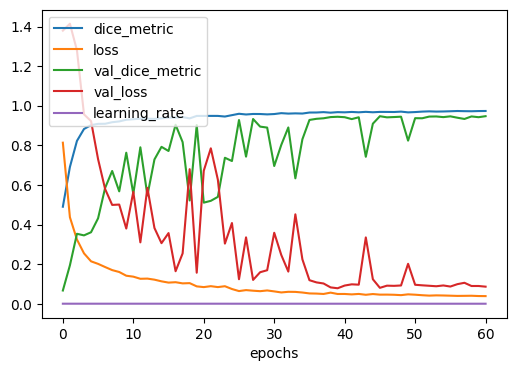

In [ ]:
# Show results as plot
pd.DataFrame(history.history).plot(figsize=(6, 4), xlabel="epochs")

In [ ]:
from keras.models import load_model
# Save the model and weights after training
model.save("person_segmentation_Unet_Resnet50.keras")

# Load the saved model
model_path = "person_segmentation_Unet_Resnet50.keras"
model = load_model(model_path, custom_objects={"dice_metric": dice_metric})

In [ ]:
# Evaluar en datos de prueba
test_loss, test_dice = model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Dice: {test_dice:.4f}")

2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - dice_metric: 0.9501 - loss: 0.0661
Test Loss: 0.0689
Test Dice: 0.9513


In [ ]:
from sklearn.metrics import f1_score

# Get predictions from the model on test data
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=-1)  # Convertir probabilidades a clases

# Calcular métricas para cada clase
def calculate_metrics_multiclass(y_true, y_pred, num_classes=4):
    metrics = {}

    # Aplanar las máscaras
    y_true_flat = y_true.squeeze().flatten()
    y_pred_flat = y_pred.flatten()

    # Calcular métricas por clase
    for class_id in range(num_classes):
        # Crear máscaras binarias para la clase actual
        true_class = (y_true_flat == class_id).astype(int)
        pred_class = (y_pred_flat == class_id).astype(int)

        # Calcular IoU
        intersection = np.sum(true_class * pred_class)
        union = np.sum(true_class) + np.sum(pred_class) - intersection
        iou = intersection / union if union != 0 else 0

        # Calcular DICE
        dice = (2 * intersection) / (np.sum(true_class) + np.sum(pred_class)) if (np.sum(true_class) + np.sum(pred_class)) != 0 else 0

        # Calcular F1
        f1 = f1_score(true_class, pred_class)

        metrics[f"Class {class_id}"] = {
            "IoU": round(iou, 4),
            "DICE": round(dice, 4),
            "F1": round(f1, 4)
        }

    return metrics

# Calcular y mostrar métricas
metrics = calculate_metrics_multiclass(y_test, y_pred_classes)

# Mostrar resultados
for class_name, class_metrics in metrics.items():
    print(f"\n{class_name}:")
    print(f"IoU: {class_metrics['IoU']}")
    print(f"DICE: {class_metrics['DICE']}")
    print(f"F1 Score: {class_metrics['F1']}")

# Calcular y mostrar promedios
mean_iou = np.mean([m['IoU'] for m in metrics.values()])
mean_dice = np.mean([m['DICE'] for m in metrics.values()])
mean_f1 = np.mean([m['F1'] for m in metrics.values()])
print("\nPromedios:")
print(f"Mean IoU: {mean_iou:.4f}")
print(f"Mean DICE: {mean_dice:.4f}")
print(f"Mean F1 Score: {mean_f1:.4f}")

2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step

Class 0:
IoU: 0.9909
F1 Score: 0.9954

Class 1:
IoU: 0.9159
F1 Score: 0.9561

Class 2:
IoU: 0.7724
F1 Score: 0.8716

Class 3:
IoU: 0.9625
F1 Score: 0.9809

Promedios:
Mean IoU: 0.9104
Mean F1 Score: 0.9510


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


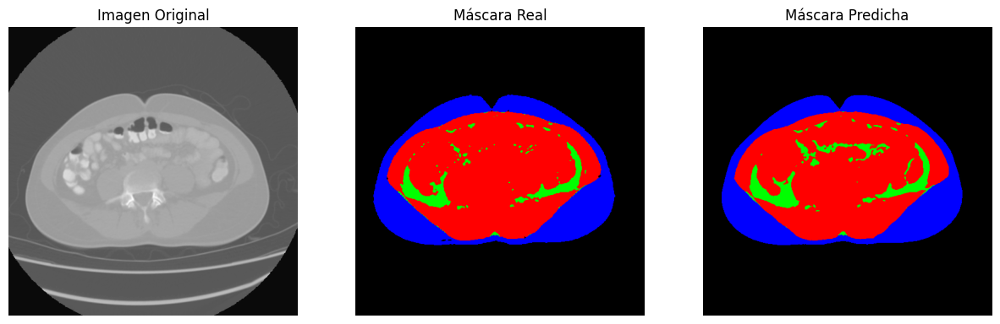

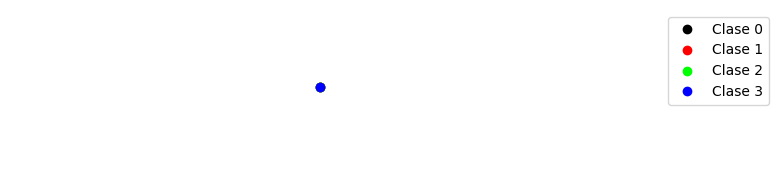

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


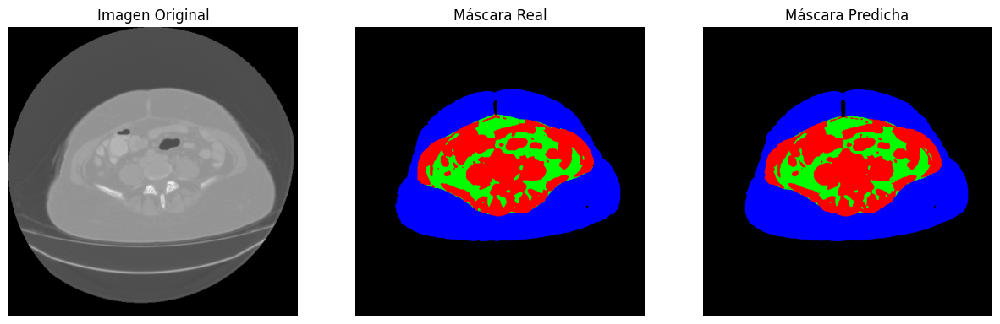

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


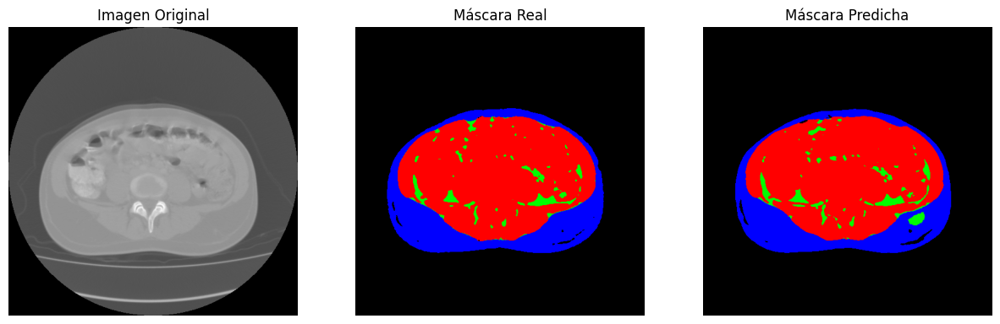

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


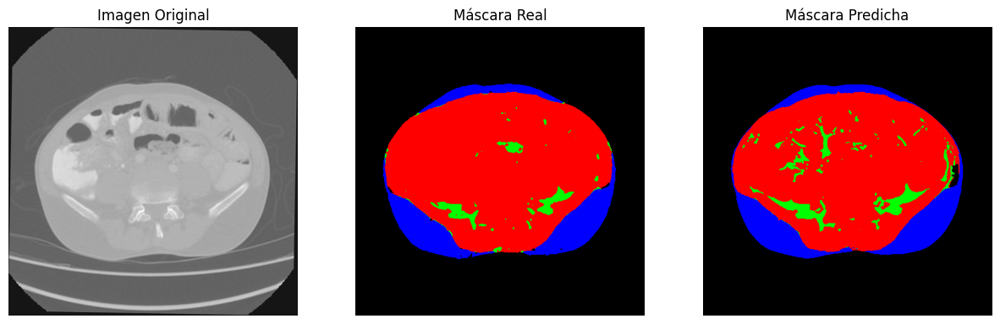

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


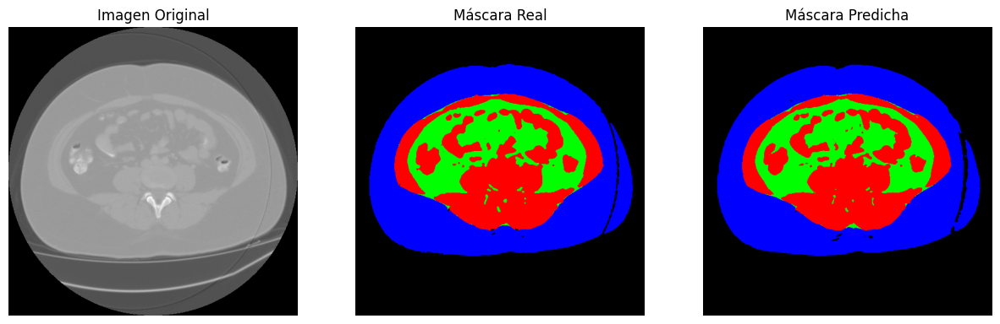

In [ ]:
# Visualize the results on test data
def visualize_results(model, X_test, y_test, num_images=5):
    # Definir colores para cada clase
    colors = {
        0: [0, 0, 0],       # Negro para fondo
        1: [1, 0, 0],       # Rojo para clase 1
        2: [0, 1, 0],       # Verde para clase 2
        3: [0, 0, 1]        # Azul para clase 3
    }

    for i in range(num_images):
        # Obtener imagen y máscara real
        img = X_test[i]
        true_mask = y_test[i].squeeze()

        # Predecir máscara
        pred = model.predict(np.expand_dims(img, axis=0))
        pred_mask = np.argmax(pred.squeeze(), axis=-1)

        # Crear máscaras coloreadas
        true_mask_colored = np.zeros((*true_mask.shape, 3))
        pred_mask_colored = np.zeros((*pred_mask.shape, 3))

        # Asignar colores a cada clase
        for class_id, color in colors.items():
            true_mask_colored[true_mask == class_id] = color
            pred_mask_colored[pred_mask == class_id] = color

        # Visualizar resultados
        plt.figure(figsize=(15, 5))

        plt.subplot(1, 3, 1)
        plt.title("Imagen Original")
        plt.imshow(img.squeeze(), cmap='gray')
        plt.axis("off")

        plt.subplot(1, 3, 2)
        plt.title("Máscara Real")
        plt.imshow(true_mask_colored)
        plt.axis("off")

        plt.subplot(1, 3, 3)
        plt.title("Máscara Predicha")
        plt.imshow(pred_mask_colored)
        plt.axis("off")

        plt.show()

        # Mostrar leyenda de colores
        if i == 0:  # Solo mostrar la leyenda una vez
            plt.figure(figsize=(8, 2))
            for class_id, color in colors.items():
                plt.plot(0, 0, 'o', color=color,
                        label=f'Clase {class_id}')
            plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
            plt.axis('off')
            plt.show()

# Visualizar resultados
visualize_results(model, X_test, y_test, num_images=5)